In [37]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
import imutils
import math
from collections import defaultdict

(Text(0.5, 1.0, 'Hue Image'), ([], []), ([], []))

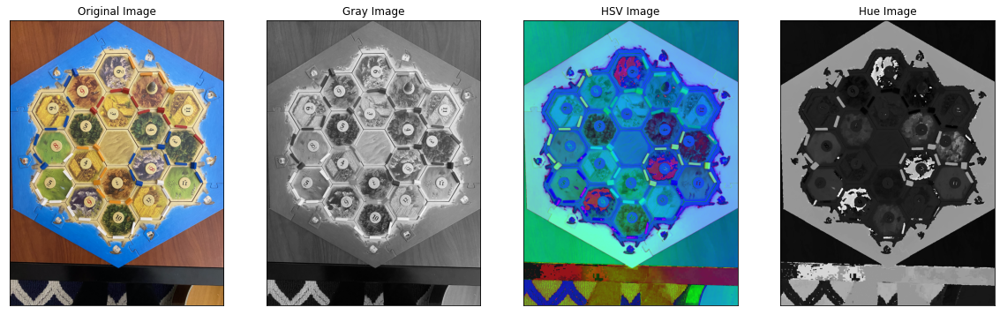

In [201]:
img_orig = cv.imread('photos/IMG_7875.png')

img_orig = imutils.resize(img_orig, width=1000)

img_gray = cv.cvtColor(img_orig, cv.COLOR_BGR2GRAY)
img = cv.cvtColor(img_orig, cv.COLOR_BGR2RGB)
img_hsv = cv.cvtColor(img_orig, cv.COLOR_BGR2HSV)
img_h = img_hsv[:,:,0]

plt.figure(figsize=(20,20))
plt.subplot(141)
plt.imshow(img)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(142)
plt.imshow(img_gray, cmap='gray')
plt.title('Gray Image'), plt.xticks([]), plt.yticks([])
plt.subplot(143)
plt.imshow(img_hsv)
plt.title('HSV Image'), plt.xticks([]), plt.yticks([])
plt.subplot(144)
plt.imshow(img_h, cmap='gray')
plt.title('Hue Image'), plt.xticks([]), plt.yticks([])

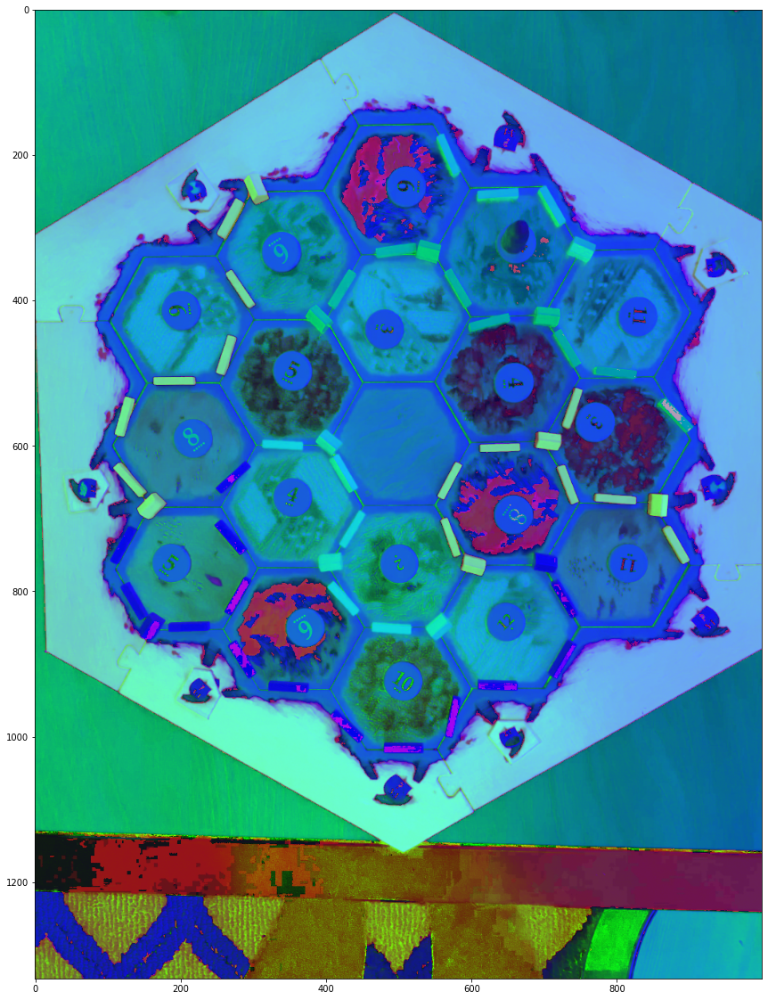

In [39]:
plt.figure(figsize=(20,20))
plt.imshow(img_hsv)

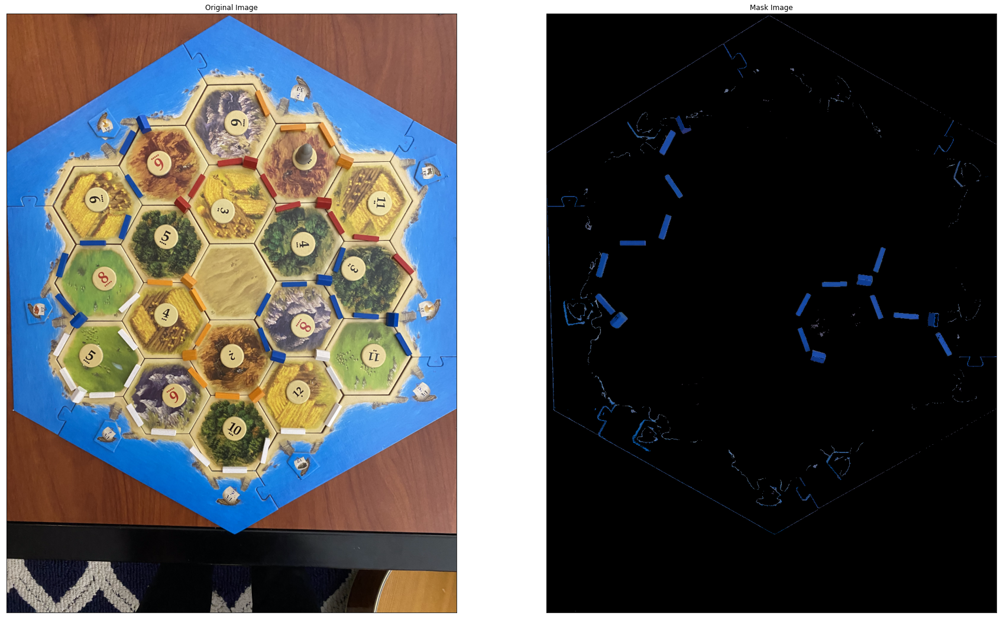

In [157]:
# FIND ROADS AND SETTLEMENTS IN IMAGE
# approach 2:
# 1. Filter the image into the HSV color space
# 2. Filter the image to only include the color range of the road

blue_lower = np.array([80, 50, 80])
blue_upper = np.array([140, 250, 180])

blue_mask = cv.inRange(img_hsv, blue_lower, blue_upper)

# see img
blue_res = cv.bitwise_and(img,img, mask= blue_mask)
plt.figure(figsize=(30, 30))
plt.subplot(121),plt.imshow(img)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(blue_res)
plt.title('Mask Image'), plt.xticks([]), plt.yticks([])
plt.show()

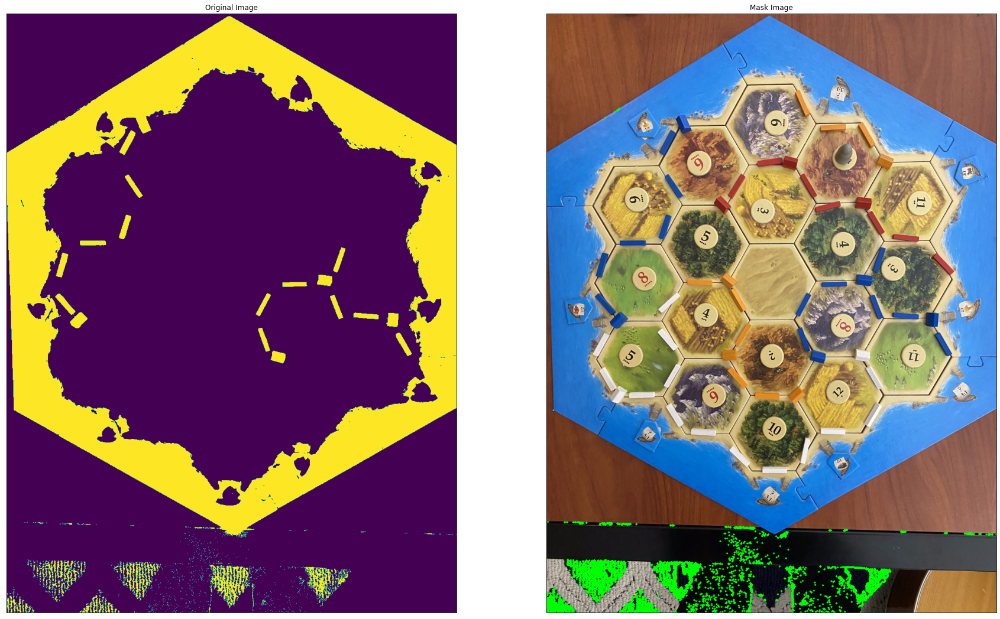

In [41]:
tmp = img.copy()

# filter out contours from mask with large area
# find contours in the mask
cnts = cv.findContours(blue_mask.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
cnts = imutils.grab_contours(cnts)

# filter out large contours
cnts = [c for c in cnts if cv.contourArea(c) < 3000]

# draw contours on original image
cv.drawContours(tmp, cnts, -1, (0, 255, 0), 3)

plt.figure(figsize=(30, 30))
plt.subplot(121),plt.imshow(blue_mask)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(tmp)
plt.title('Mask Image'), plt.xticks([]), plt.yticks([])
plt.show()

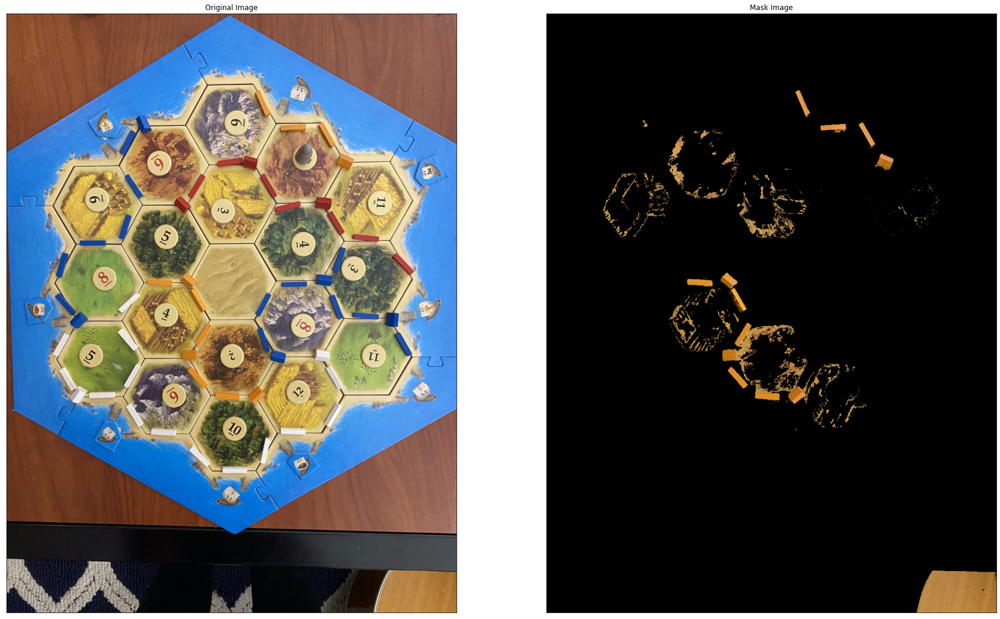

In [160]:
orange_lower = np.array([15, 140, 150])
orange_upper = np.array([20, 255, 255])

orange_mask = cv.inRange(img_hsv, orange_lower, orange_upper)

# see img
orange_res = cv.bitwise_and(img,img, mask= orange_mask)
plt.figure(figsize=(30, 30))
plt.subplot(121),plt.imshow(img)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(orange_res)
plt.title('Mask Image'), plt.xticks([]), plt.yticks([])
plt.show()

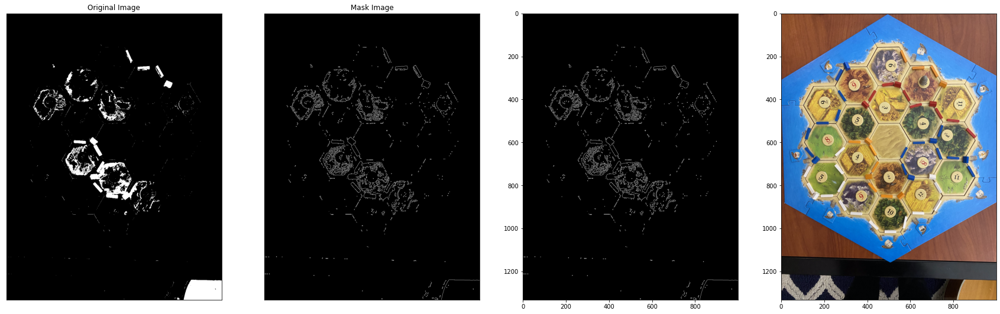

In [43]:
# temporary version of img
tmp = img.copy()

# get edges from orange mask
orange_edges = cv.Canny(orange_mask, 100, 200)

# get contours from orange edges
contours, hierarchy = cv.findContours(orange_edges, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

# filter out contours with small area
contours = [cnt for cnt in contours if cv.contourArea(cnt) > 50]

# filter out non-rectangular contours
rect_contours = []
for contour in contours:
    approx = cv.approxPolyDP(contour, 0.01*cv.arcLength(contour, True), True)
    if len(approx) == 4:
        rect_contours.append(contour)

contours = rect_contours

# draw contours
img_contours = cv.drawContours(tmp, contours, -1, (0,255,0), 3)

edges_contours = cv.drawContours(orange_edges, contours, -1, (0,255,0), 3)

plt.figure(figsize=(30, 30))
plt.subplot(141),plt.imshow(orange_mask, cmap='gray')
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(142),plt.imshow(orange_edges, cmap='gray')
plt.title('Mask Image'), plt.xticks([]), plt.yticks([])

plt.subplot(143),plt.imshow(edges_contours, cmap='gray')

plt.subplot(144),plt.imshow(img_contours, cmap='gray')
plt.show()

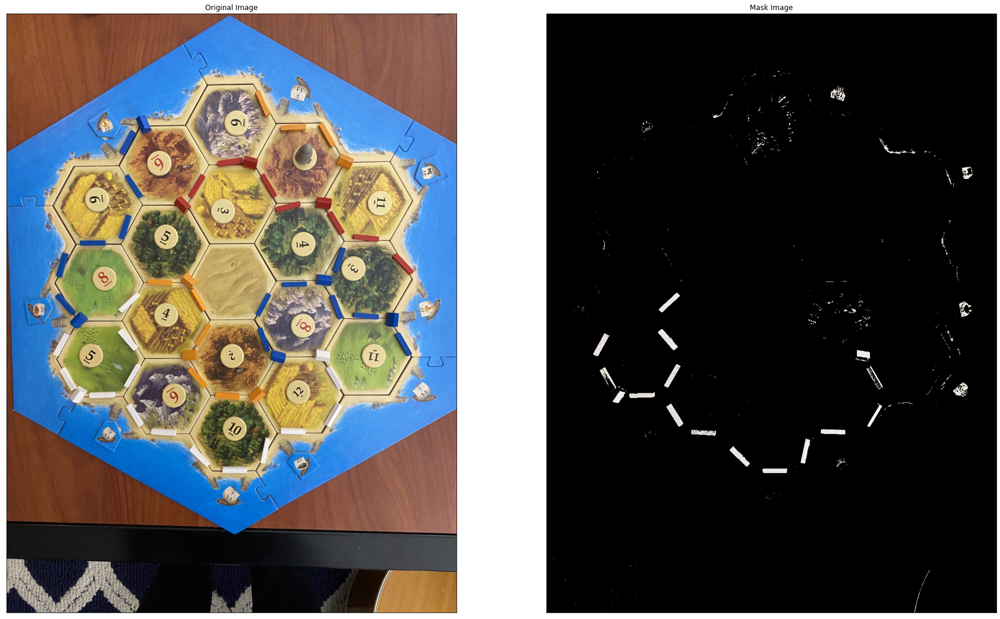

In [44]:
white_lower = np.array([210, 210, 210])
white_upper = np.array([255, 255, 255])

# easier to detect white on original image
white_mask = cv.inRange(img_orig, white_lower, white_upper)

# see img
white_res = cv.bitwise_and(img,img, mask= white_mask)
plt.figure(figsize=(30, 30))
plt.subplot(121),plt.imshow(img)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(white_res)
plt.title('Mask Image'), plt.xticks([]), plt.yticks([])
plt.show()

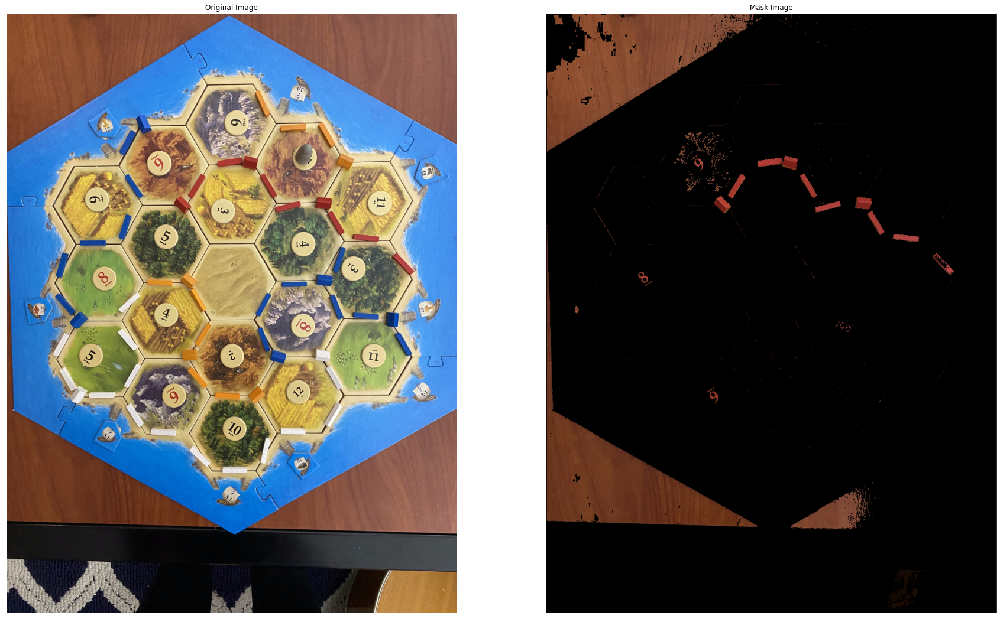

In [177]:
red_lower = np.array([0, 140, 0])
red_upper = np.array([10, 255, 255])

red_mask = cv.inRange(img_hsv, red_lower, red_upper)

# see img
red_res = cv.bitwise_and(img,img, mask= red_mask)
plt.figure(figsize=(30, 30))
plt.subplot(121),plt.imshow(img)
plt.title('Original Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(red_res)
plt.title('Mask Image'), plt.xticks([]), plt.yticks([])
plt.show()

([], [])

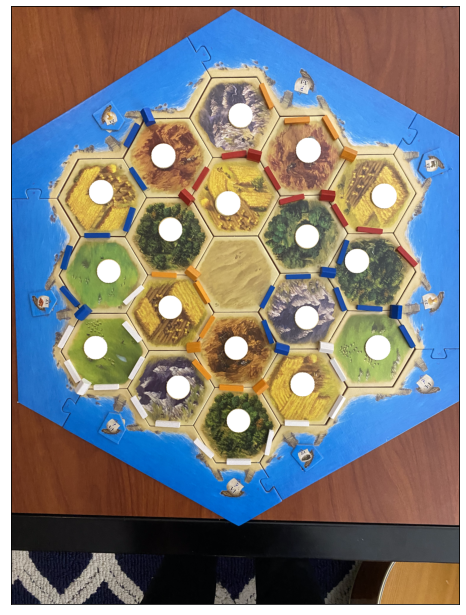

In [46]:
############################################
# get each number circle
############################################

circles = cv.HoughCircles(img_gray,cv.HOUGH_GRADIENT_ALT,1,20,
                            param1=50,param2=.92,minRadius=10,maxRadius=50)
circles = np.uint16(np.around(circles))[0,:,0:3]
circles_img = img.copy()
for circ in circles:
    cv.circle(circles_img,(circ[0],circ[1]),circ[2],(255,255,255),-1)
plt.figure(figsize=(11,11))
plt.imshow(circles_img)
plt.xticks([])
plt.yticks([])

174.44243207187594


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


([], [])

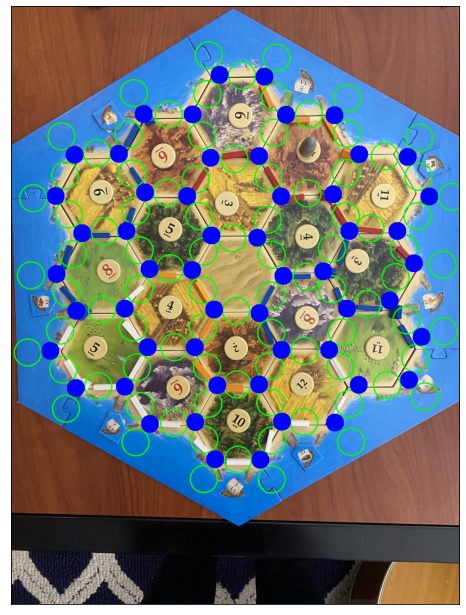

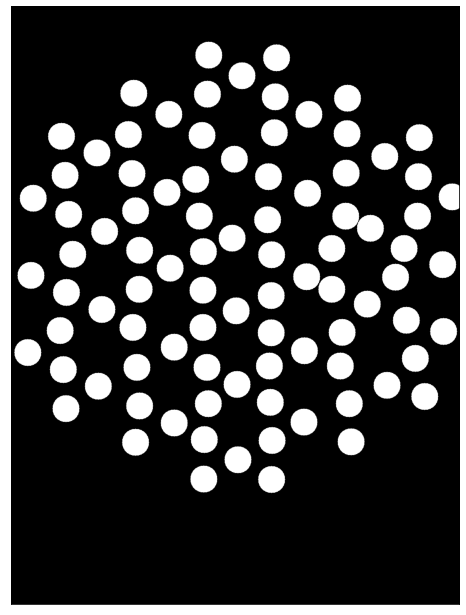

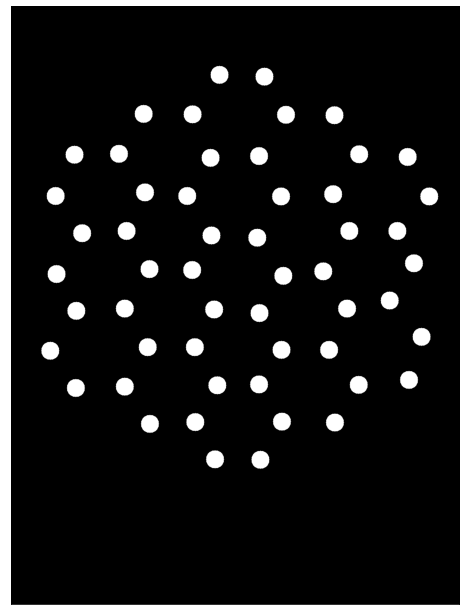

In [190]:
#########################
# get average distance
#########################

num_short_distances = 3 * 6 + 4 * 6 + 6 * 5
all_distances = []

circles = np.array(circles, dtype=np.float64)
def distanceBetweenCircles(c1, c2):
    return math.sqrt(((c1[0] - c2[0]) ** 2) + ((c1[1] - c2[1]) ** 2))

for i in range(len(circles)):
    for j in range(len(circles)):
        if (i != j):
            all_distances.append(distanceBetweenCircles(circles[i], circles[j]))

all_distances.sort()


short_distances_sum = 0
for i in range(num_short_distances):
    short_distances_sum += all_distances[i]

average_distance = short_distances_sum / num_short_distances
print(average_distance)
distance_range = 60

img_copy = img.copy()
circles_map = defaultdict(list)

def populate_map(map_to_pop, circs, img_c=None):
    for i in range(len(circs)):
        for j in range(len(circs)):
            if (distanceBetweenCircles(circs[i], circs[j]) >= average_distance - distance_range and distanceBetweenCircles(circs[i], circs[j]) <= average_distance + distance_range):
                map_to_pop[i].append(j)
                if img_c is not None:
                    cv.line(img_c, (int(circs[i][0]), int(circs[i][1])), (int(circs[j][0]), int(circs[j][1])), (255, 0, 0), 5)
    return map_to_pop, img_c

circles_map, img_copy = populate_map(circles_map, circles, img_copy)

def angleBetweenCircles(c1, c2):
    delta_x = c2[0] - c1[0]
    delta_y = c2[1] - c1[1]
    return math.atan2(delta_y, delta_x)

# get outer circles
outer_circles = []
inner_circles = []
outer_real_circles = []
current_outer_circle = None
top_most_outer_y = 9999
top_most_outer_real_y = 9999
top_most_inner_y = 9999
for key in circles_map:
    val = circles_map[key]
    if (len(val) == 3):
        cur_angles = []
        for other_c in val:
            cur_angles.append((math.pi * 2) + angleBetweenCircles(circles[key], circles[other_c]))
        cur_angles.sort()
        if (cur_angles[1] - cur_angles[0] - (math.pi / 6) > 1):
            cur_angles[0] += (math.pi * 2)
        if (cur_angles[2] - cur_angles[1] - (math.pi / 6) > 1):
            cur_angles[2] -= (math.pi * 2)
        cur_angles.sort()
        
        # add other angles
        maxAngle = cur_angles[2]
        for i in range(3):
            maxAngle += math.pi / 3
            newX = circles[key][0] + (average_distance * math.cos(maxAngle))
            newY = circles[key][1] + (average_distance * math.sin(maxAngle))
            cv.line(img_copy, (int(circles[key][0]), int(circles[key][1])), (int(newX), int(newY)), (0, 255, 0), 5)
            outer_circles.append([newX, newY])
            top_most_outer_y = min(top_most_outer_y, newY)
            if (i == 1):
                current_outer_circle = [newX, newY]
            if (i == 0):
                next_outer_circle = [newX, newY]

    elif (len(val) == 5):
        inner_circles.append(circles[key])
        top_most_inner_y = min(top_most_inner_y, circles[key][1])
    
    if (len(val) != 5):
        outer_real_circles.append(circles[key])
        top_most_outer_real_y = min(top_most_outer_real_y, circles[key][1])

# get center circle
average_inner_x = 0
average_inner_y = 0
for c in inner_circles:
    average_inner_x += c[0]
    average_inner_y += c[1]
average_inner_x /= 6
average_inner_y /= 6

center_circle = [average_inner_x, average_inner_y]

cv.circle(img_copy, (int(average_inner_x), int(average_inner_y)), 20, (0, 0, 255), -1)

# number
def sort_circles(c):
  return angleBetweenCircles(c, center_circle)

# find top most outer circle
outer_circles.sort(key=sort_circles)
top_most_outer_y_index = 0
num_outer_circles = len(outer_circles)
for i in range(len(outer_circles)):
    cur_c = outer_circles[i]
    if (cur_c[1] == top_most_outer_y):
        top_most_outer_y_index = i
        break
outer_circles += outer_circles

# find top most outer real circle
outer_real_circles.sort(key=sort_circles)
top_most_outer_real_y_index = 0
num_outer_real_circles = len(outer_real_circles)
for i in range(len(outer_real_circles)):
    cur_c = outer_real_circles[i]
    if (cur_c[1] == top_most_outer_real_y):
        top_most_outer_real_y_index = i
        break
outer_real_circles += outer_real_circles

# find top most inner circles
inner_circles.sort(key=sort_circles)
top_most_inner_y_index = 0
num_inner_circles = len(inner_circles)
for i in range(len(inner_circles)):
    cur_c = inner_circles[i]
    if (cur_c[1] == top_most_inner_y):
        top_most_inner_y_index = i
        break
inner_circles += inner_circles

points = []
point_num = 0
for i in range(top_most_outer_y_index, top_most_outer_y_index + num_outer_circles):
    cur_c = outer_circles[i]
    # cv.putText(img_copy, str(point_num), (int(cur_c[0]), int(cur_c[1])), cv.FONT_HERSHEY_SIMPLEX, .8, (255, 255, 255), 2)
    point_num += 1
    points.append([cur_c[0], cur_c[1]])

for i in range(top_most_outer_real_y_index, top_most_outer_real_y_index + num_outer_real_circles):
    cur_c = outer_real_circles[i]
    #cv.putText(img_copy, str(point_num), (int(cur_c[0]), int(cur_c[1])), cv.FONT_HERSHEY_SIMPLEX, .8, (255, 255, 255), 2)
    point_num += 1
    points.append([cur_c[0], cur_c[1]])

for i in range(top_most_inner_y_index, top_most_inner_y_index + num_inner_circles):
    cur_c = inner_circles[i]
    # cv.putText(img_copy, str(point_num), (int(cur_c[0]), int(cur_c[1])), cv.FONT_HERSHEY_SIMPLEX, .8, (255, 255, 255), 2)
    point_num += 1
    points.append([cur_c[0], cur_c[1]])

# cv.putText(img_copy, str(point_num), (int(center_circle[0]), int(center_circle[1])), cv.FONT_HERSHEY_SIMPLEX, .8, (255, 255, 255), 2)
points.append([center_circle[0], center_circle[1]])

for i in range(len(points)):
    cur_c = points[i]
    cv.putText(img_copy, str(i), (int(cur_c[0]), int(cur_c[1])), cv.FONT_HERSHEY_SIMPLEX, .8, (255, 255, 255), 2)

all_circs_map = defaultdict(list)
test_img = img.copy()
# all_circs_map, test_img = populate_map(all_circs_map, points, test_img)

# go around ordered circle and find all neighbors
neighbor_sets = {}
neighbors = []
for i in range(len(points)):
    neighbors = []
    color = list(np.random.random(size=3) * 256)
    for j in range(len(points)):
        if (distanceBetweenCircles(points[i], points[j]) >= average_distance - distance_range and distanceBetweenCircles(points[i], points[j]) <= average_distance + distance_range):
            neighbors.append(j)
            cv.line(test_img, (int(points[i][0]), int(points[i][1])), (int(points[j][0]), int(points[j][1])), color, 5)
    neighbor_sets[i] = neighbors

check_loc_img = img.copy()
road_mask_all = np.zeros(img.shape)
settlement_mask_all = np.zeros(img.shape)
check_road_radius = 30
check_settlement_radius = 20

# find possible road locations
road_locs = []
road_masks = []
for num in neighbor_sets:
    first_pt = points[num]
    for neighbor in neighbor_sets[num]:
        road_mask = np.zeros(img.shape)
        second_pt = points[neighbor]
        road_loc = (int((first_pt[0]+second_pt[0])/2), int((first_pt[1]+second_pt[1])/2))
        road_locs.append({"pts":[first_pt, second_pt], "loc":road_loc, "mask":road_mask, "neighbors":[num, neighbor]})
        cv.circle(check_loc_img, road_loc, 30, (0,255,0), 2)
        cv.circle(road_mask_all, road_loc, check_road_radius, (255,255,255), -1)
        cv.circle(road_mask, road_loc, check_road_radius, (255,255,255), -1)
        road_masks.append(road_mask)

## find possible settlement locations
# make copy of neighbors
# find dists between neighboring neighbors
# find centroid of each neighbor triplet
settlement_locs = []
settlement_masks = []
for num in neighbor_sets:
    first_pt = points[num]
    neighbors_copy = neighbor_sets[num]

    # compute dists between all neighbors
    neighbor_pts = np.array(points)[np.array(neighbors_copy)]
    n_dists = []
    for i, n_1 in enumerate(neighbors_copy):
        for j, n_2 in enumerate(neighbors_copy):
            if (i < j):
                dist = distanceBetweenCircles(neighbor_pts[i], neighbor_pts[j])
                if dist < 200:
                    n_dists.append([n_1,n_2])
    for pair in n_dists:
        settlement_mask = np.zeros(img.shape)
        second_pt = points[pair[0]]
        third_pt = points[pair[1]]
        settlement_loc = (int((first_pt[0]+second_pt[0]+third_pt[0])/3),int((first_pt[1]+second_pt[1]+third_pt[1])/3))
        settlement_locs.append({"pts":[first_pt, second_pt, third_pt], "loc":settlement_loc, "mask":settlement_mask, "neighbors":pair})
        cv.circle(check_loc_img, settlement_loc, 20, (0,0,255), -1)
        cv.circle(settlement_mask_all, settlement_loc, check_settlement_radius, (255,255,255), -1)
        settlement_masks.append(settlement_mask)

plt.figure(figsize=(11,11))
plt.imshow(check_loc_img)
plt.xticks([])
plt.yticks([])
plt.figure(figsize=(11,11))
plt.imshow(road_mask_all)
plt.xticks([])
plt.yticks([])
plt.figure(figsize=(11,11))
plt.imshow(settlement_mask_all)
plt.xticks([])
plt.yticks([])

([], [])

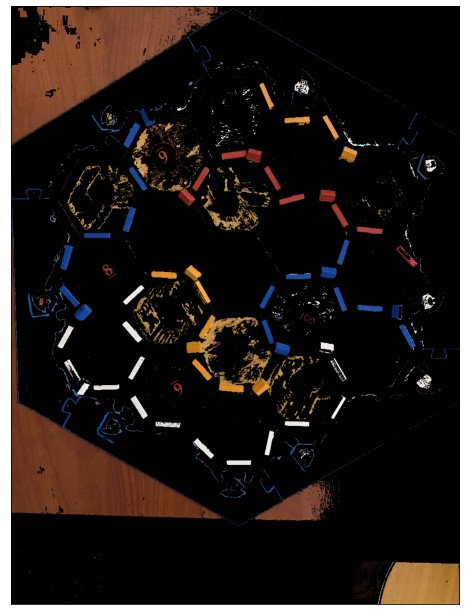

In [164]:
all_res = white_res + orange_res + blue_res + red_res

plt.figure(figsize=(11,11))
plt.imshow(all_res)
plt.xticks([])
plt.yticks([])

([], [])

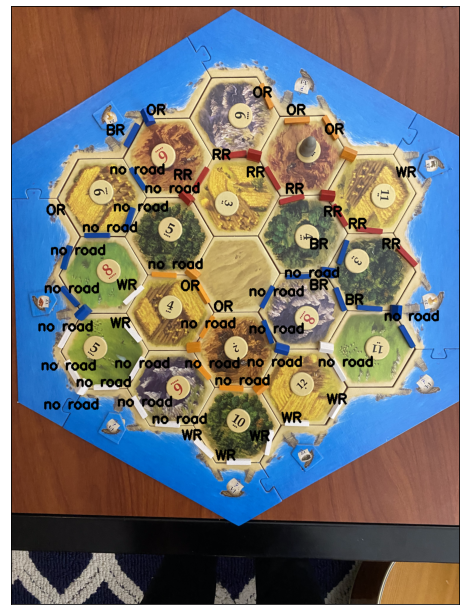

In [267]:
road_set_labeled_img = img.copy()

# true if c1 between c2_l and c2_h, false otherwise
def between_color_range(c1,c2_l,c2_h):
    if c1[0] > c2_l[0] and c1[1] > c2_l[1] and c1[2] > c2_l[2] and c1[0] < c2_h[0] and c1[1] < c2_h[1] and c1[2] < c2_h[2]:
        return True
    return False
nonblack_px_thresh = 250
for road_info in road_locs:
    # road_info = road_locs[5]
    road_pt = road_info["loc"]
    targeted_road = np.where(road_info["mask"]==0,0,all_res)[road_pt[1]-check_road_radius:road_pt[1]+check_road_radius,road_pt[0]-check_road_radius:road_pt[0]+check_road_radius]
    # count nonblack pixels
    total_pixels = targeted_road.shape[0] * targeted_road.shape[1]
    nonblack_px = np.count_nonzero(np.all(targeted_road!=[0,0,0],axis=2))
    # print(f"nonblack_px: {nonblack_px}")

    label = "no road"
    # only search if something exists in img
    if nonblack_px > nonblack_px_thresh:
        # compute dominant color of nonblack pixels
        pixels = np.float32(targeted_road.reshape(-1, 3))
        n_colors = 5
        criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 200, .1)
        flags = cv.KMEANS_RANDOM_CENTERS
        _, labels, palette = cv.kmeans(pixels, n_colors, None, criteria, 10, flags)
        _, counts = np.unique(labels, return_counts=True)
        # print(f"palette: {palette}")
        # print(f"labels: {len(labels)}")
        # if nonblack_px < total_pixels/2
        # get second most dominant color since first is probably black
        dom = palette[np.argsort(counts)[-2]]
        # make sure second most dominant color isn't black
        if dom[0] < 1 and dom[1] < 1 and dom[2] < 1:
            dom = palette[np.argsort(counts)[-1]]

        # print(f"dom: {dom}")

        orange_rgb_l = [190,130,50]
        orange_rgb_h = [255,180,100]

        blue_rgb_l = [30,50,140]
        # blue_rgb_m = [62,84,166]
        blue_rgb_h = [75,95,180]

        white_rgb_l = [225,225,225]
        white_rgb_h = [255,255,255]

        red_rgb_l = [100,35,30]
        # red_rgb_m = [134,67,57]
        red_rgb_h = [230,80,75]


        if between_color_range(dom, orange_rgb_l, orange_rgb_h):
            label = "OR"
        elif between_color_range(dom, blue_rgb_l, blue_rgb_h):
            label = "BR"
        elif between_color_range(dom, white_rgb_l, white_rgb_h):
            label = "WR"
        elif between_color_range(dom, red_rgb_l, red_rgb_h):
            label = "RR"

        cv.putText(road_set_labeled_img, label, (road_info["loc"][0]-50, road_info["loc"][1]), cv.FONT_HERSHEY_SIMPLEX, 1, (0,0,0), 3)

plt.figure(figsize=(11,11))
plt.imshow(road_set_labeled_img)
plt.xticks([])
plt.yticks([])

([], [])

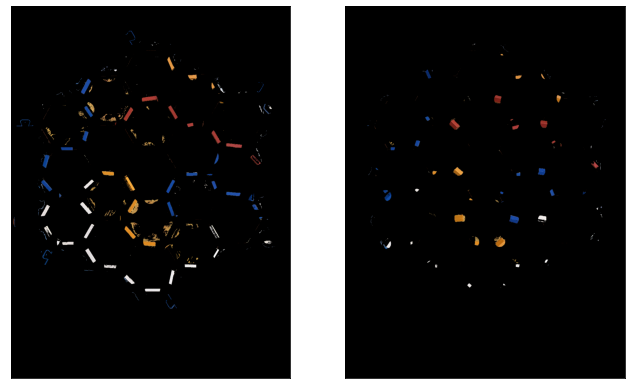

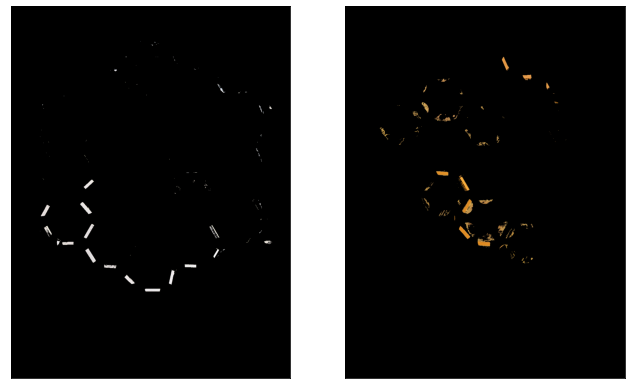

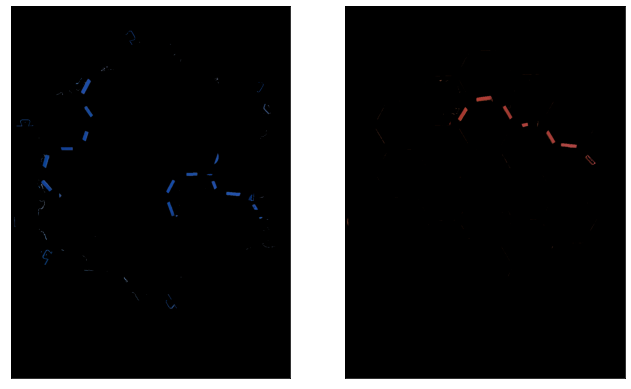

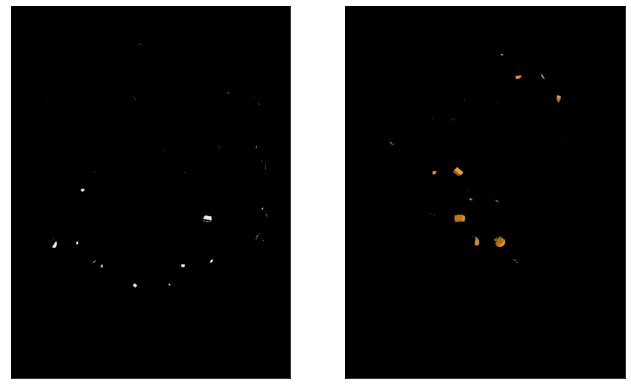

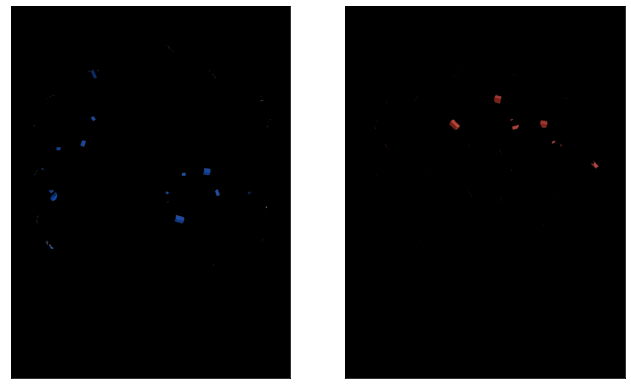

In [178]:
possible_roads_img = np.where(road_mask_all==0, 0, all_res)
possible_settles_img = np.where(settlement_mask_all==0, 0, img)

plt.figure(figsize=(11,11))
plt.subplot(1,2,1)
plt.imshow(possible_roads_img)
plt.xticks([])
plt.yticks([])
plt.subplot(1,2,2)
plt.imshow(possible_settles_img)
plt.xticks([])
plt.yticks([])

plt.figure(figsize=(11,11))
plt.subplot(1,2,1)
plt.imshow(np.where(road_mask_all==0,0,white_res))
plt.xticks([])
plt.yticks([])
plt.subplot(1,2,2)
plt.imshow(np.where(road_mask_all==0,0,orange_res))
plt.xticks([])
plt.yticks([])

plt.figure(figsize=(11,11))
plt.subplot(1,2,1)
plt.imshow(np.where(road_mask_all==0,0,blue_res))
plt.xticks([])
plt.yticks([])
plt.subplot(1,2,2)
plt.imshow(np.where(road_mask_all==0,0,red_res))
plt.xticks([])
plt.yticks([])

plt.figure(figsize=(11,11))
plt.subplot(1,2,1)
plt.imshow(np.where(settlement_mask_all==0,0,white_res))
plt.xticks([])
plt.yticks([])
plt.subplot(1,2,2)
plt.imshow(np.where(settlement_mask_all==0,0,orange_res))
plt.xticks([])
plt.yticks([])

plt.figure(figsize=(11,11))
plt.subplot(1,2,1)
plt.imshow(np.where(settlement_mask_all==0,0,blue_res))
plt.xticks([])
plt.yticks([])
plt.subplot(1,2,2)
plt.imshow(np.where(settlement_mask_all==0,0,red_res))
plt.xticks([])
plt.yticks([])

In [48]:
# FIND ROADS AND SETTLEMENTS IN IMAGE
# approach:
# 1. use canny to detect lines in image
# 2. use hough transform to detect lines in image
# 3. group parallel lines together
# 4. group lines that are close together
# 5. profit??

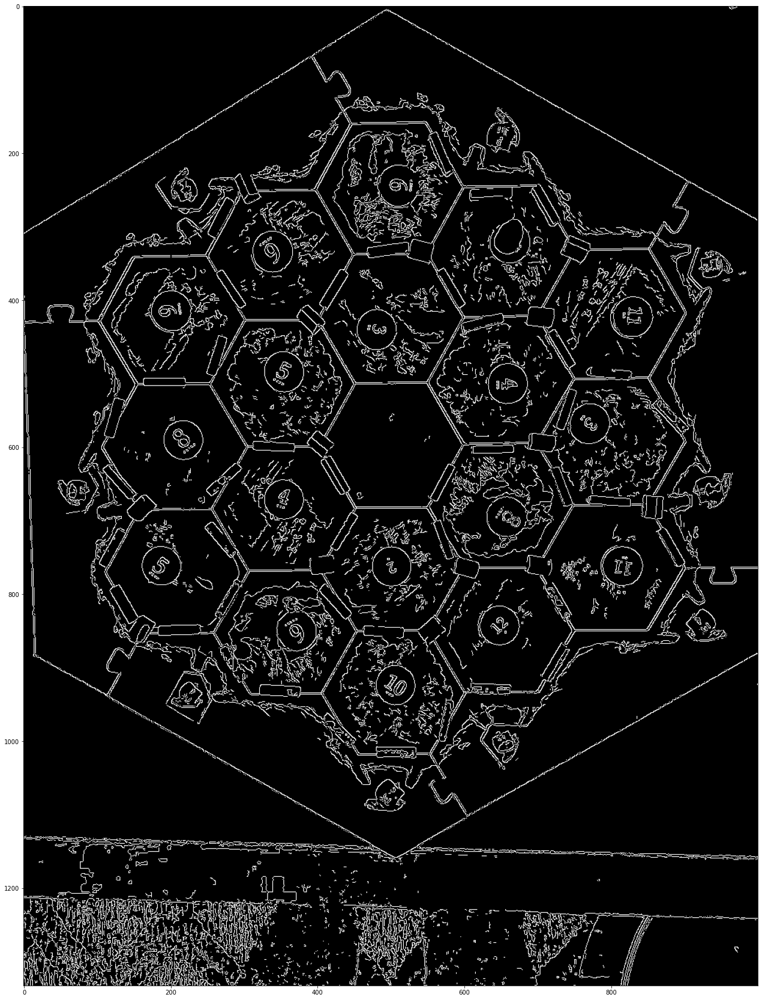

In [49]:
# resize image to speed up processing
# also roads look more uniform at smaller scale
# img_gray_resize = cv.resize(img_gray, (0,0), fx=0.5, fy=0.5)

# blur and threshold before applying canny
# blur = cv.GaussianBlur(img_hsv, (5,5), 0)
# thresh = cv.threshold(blur, 0, 255, cv.THRESH_BINARY_INV + cv.THRESH_OTSU)[1]
edges = cv.Canny(img_hsv, 200, 300)
# edges = cv.Canny(img_gray_resize, 300, 400)

plt.figure(figsize=(30, 30))
plt.imshow(edges, cmap='gray')

458


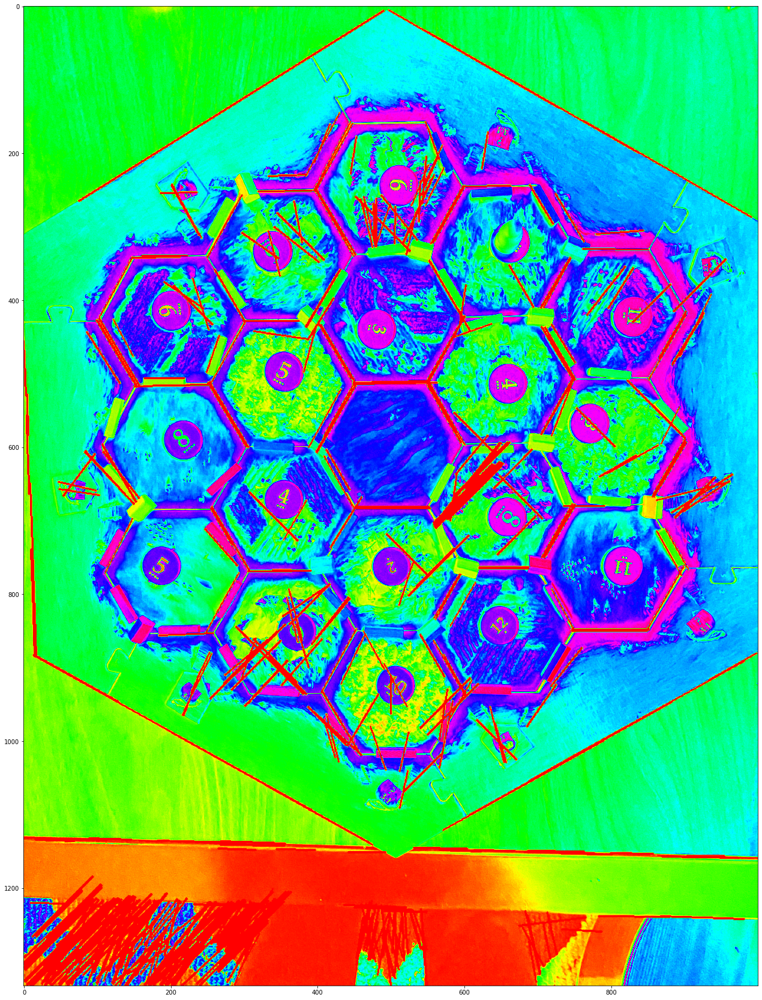

In [50]:
# 2. use hough transform to detect lines in image
tmp = img_gray.copy()

lines = cv.HoughLinesP(edges, 1, np.pi/180, 100, minLineLength=50, maxLineGap=10)
print(len(lines))

# draw lines on image
for line in lines:
    x1, y1, x2, y2 = line[0]
    cv.line(tmp, (x1, y1), (x2, y2), (0, 255, 0), 2)

# show image with lines
plt.figure(figsize=(30, 30))
plt.imshow(tmp, cmap='hsv')